# Pannel Detection

1. We started with a COCO-format solar-panel segmentation dataset and converted it into a clean YOLO segmentation dataset with a single solar_panel class. We validated the dataset structure, image/label pairing, class mapping, and annotation quality before training. The notebook uses separate train, validation, and test splits.
2. We then established a baseline segmentation model using YOLO26m-seg, trained at 640×640 resolution with CPU execution and controlled augmentation. The training pipeline produces the standard Ultralytics training artifacts, including best.pt and last.pt.
3. We evaluated the trained model: Precision & Recall & Mask IoU

# dataset collection

In [1]:
from pathlib import Path
import json

In [2]:
DATASET_DIR=  Path.home() / "Workspace" / "Solor_defect_DB" / "solar-panel-segmentation"

In [3]:
TRAIN_DIR = DATASET_DIR / "train"
VALID_DIR = DATASET_DIR / "valid"
TEST_DIR  = DATASET_DIR / "test"

TRAIN_ANNOTATION = TRAIN_DIR / "_annotations.coco.json"
VALID_ANNOTATION = VALID_DIR / "_annotations.coco.json"
TEST_ANNOTATION  = TEST_DIR / "_annotations.coco.json"

In [4]:
with open(TRAIN_ANNOTATION, "r") as f:
    train_data = json.load(f)

with open(VALID_ANNOTATION, "r") as f:
    valid_data = json.load(f)

with open(TEST_ANNOTATION, "r") as f:
    test_data = json.load(f)

print("Train")
print("Images:", len (train_data["images"]))
print("Annotation:", len(train_data["annotations"]))
print("Train:", train_data.keys())

print("\nVALID")
print("Images:", len(valid_data["images"]))
print("Annotations:", len(valid_data["annotations"]))
print("Valid:", valid_data.keys())

print("\nTEST")
print("Images:", len(test_data["images"]))
print("Annotations:", len(test_data["annotations"]))
print("Test :", test_data.keys())


Train
Images: 1449
Annotation: 13136
Train: dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

VALID
Images: 94
Annotations: 1038
Valid: dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

TEST
Images: 64
Annotations: 732
Test : dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])


In [5]:
categories = train_data["categories"]

print("classes:")
for category in categories:
    print(f"ID: {category['id']} -> {category['name']}")

classes:
ID: 0 -> panels
ID: 1 -> solar_row


# dataset Analysis

In [6]:
def check_missing_images(data, image_dir):
    missing = []

    for image in data["images"]:
        image_path= image_dir / image["file_name"]

        if not image_path.exists():
            missing.append(image["file_name"])
    return missing


train_missing = check_missing_images(train_data, TRAIN_DIR)
valid_missing = check_missing_images(valid_data, VALID_DIR)
test_missing = check_missing_images(test_data, TEST_DIR)

print("Missing images")
print("Train:", len(train_missing))
print("Valid:", len(valid_missing))
print("Test :", len(test_missing))


Missing images
Train: 0
Valid: 0
Test : 0


In [7]:
def check_missing_annotations(data):
    invalid = 0

    for ann in data["annotations"]:
        if "segmentation" not in ann or not ann["segmentation"]:
            invalid += 1

    return invalid


print("Invalid annotations:")
print("Train:", check_missing_annotations(train_data))
print("Valid:", check_missing_annotations(valid_data))
print("Test :", check_missing_annotations(test_data))

Invalid annotations:
Train: 0
Valid: 0
Test : 0


Step 1: Random Samples

In [8]:
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np

/home/hraj/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


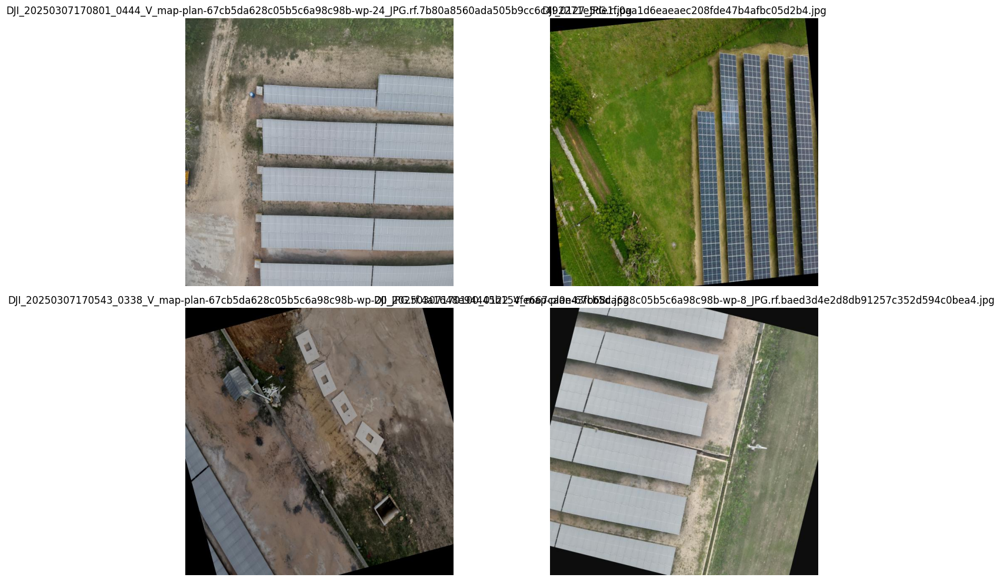

In [9]:
SEED=42
random.seed(SEED)
sample_images = random.sample(train_data["images"], 4)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, image_info in zip(axes.flat, sample_images):
    image_path = TRAIN_DIR / image_info["file_name"]

    image = cv2.imread(str(image_path))

    if image is None:
        print(f"Could not read: {image_path}")
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax.imshow(image)
    ax.set_title(image_info["file_name"])
    ax.axis("off")

plt.tight_layout()
plt.show()

Step 2: Ground-Truth Masks

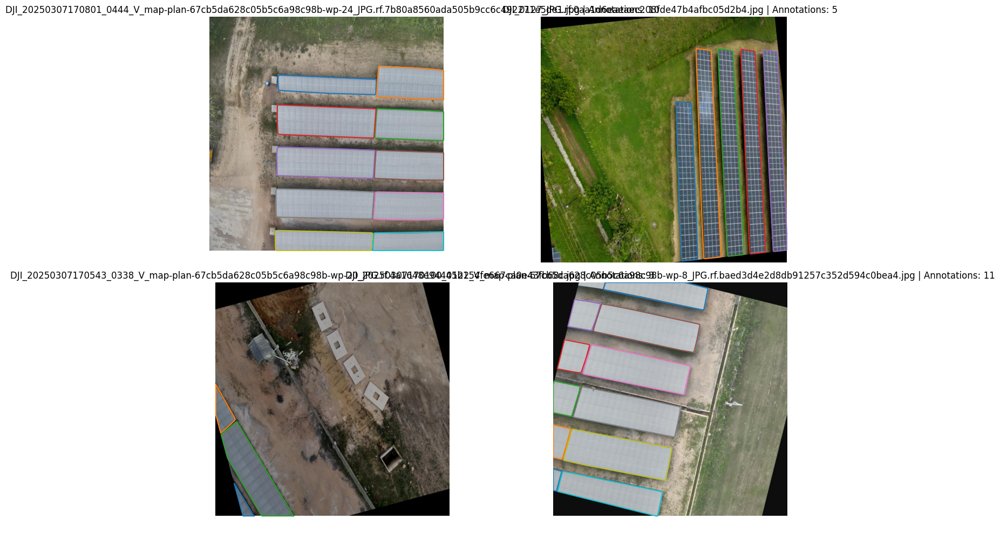

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, image_info in zip(axes.flat, sample_images):

    image_path = TRAIN_DIR / image_info["file_name"]
    image = cv2.imread(str(image_path))

    if image is None:
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax.imshow(image)

    # Find annotations for thae image
    annotations = [
        ann for ann in train_data["annotations"]
        if ann["image_id"] == image_info["id"]
    ]

    # Draw segmentation polygons
    for ann in annotations:

        segmentation = ann.get("segmentation", [])

        if not isinstance(segmentation, list):
            continue

        for polygon in segmentation:

            points = np.array(polygon, dtype=np.float32).reshape(-1, 2)

            ax.plot(
                points[:, 0],
                points[:, 1],
                linewidth=1.5
            )

    ax.set_title(
        f"{image_info['file_name']} | "
        f"Annotations: {len(annotations)}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

Step 3: images with the highest number of annotations

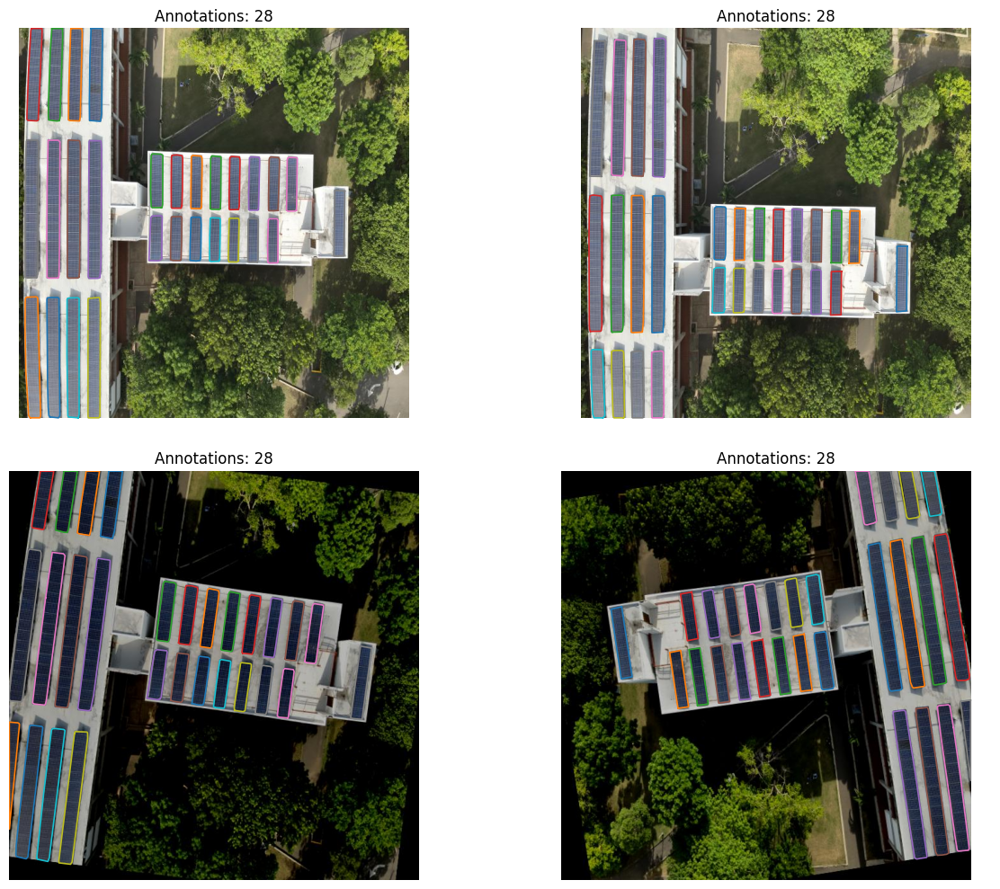

In [11]:
annotation_counts = {}

for image in train_data["images"]:
    count = sum(
        1 for ann in train_data["annotations"]
        if ann["image_id"] == image["id"]
    )
    annotation_counts[image["id"]] = count

difficult_images = sorted(
    train_data["images"],
    key=lambda x: annotation_counts[x["id"]],
    reverse=True
)[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, image_info in zip(axes.flat, difficult_images):

    image_path = TRAIN_DIR / image_info["file_name"]
    image = cv2.imread(str(image_path))

    if image is None:
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax.imshow(image)

    annotations = [
        ann for ann in train_data["annotations"]
        if ann["image_id"] == image_info["id"]
    ]

    for ann in annotations:
        for polygon in ann.get("segmentation", []):
            points = np.array(
                polygon,
                dtype=np.float32
            ).reshape(-1, 2)

            ax.plot(
                points[:, 0],
                points[:, 1],
                linewidth=1.2
            )

    ax.set_title(
        f"Annotations: {len(annotations)}"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

Step 4 — Tiny Masks

In [12]:
def find_tiny_masks(data, threshold=100):
    tiny = [
        ann
        for ann in data["annotations"]
        if ann.get("area", 0) < threshold
    ]
    return tiny


train_tiny = find_tiny_masks(train_data)
valid_tiny = find_tiny_masks(valid_data)
test_tiny = find_tiny_masks(test_data)

print("Tiny masks (< 100 pixels):")
print("Train:", len(train_tiny))
print("Valid:", len(valid_tiny))
print("Test :", len(test_tiny))

Tiny masks (< 100 pixels):
Train: 19
Valid: 10
Test : 2


In [13]:
print(train_data["annotations"][0])

{'id': 0, 'image_id': 0, 'category_id': 1, 'bbox': [247, 549, 331.665, 90.781], 'area': 30108.793, 'segmentation': [[577.464, 640, 578.604, 631.564, 578.719, 628.049, 577.4, 627.034, 290.199, 553.266, 269.379, 549.219, 267.215, 551.578, 252.967, 604.404, 247.054, 631.81, 289.188, 640, 577.464, 640]], 'iscrowd': 0}


# dataset Preprocessing

In [14]:
import shutil

In [15]:
YOLO_ROOT = DATASET_DIR / "yolo_dataset"
DATA_YAML = YOLO_ROOT / "data.yaml"

YOLO_ROOT.mkdir(parents=True, exist_ok=True)

print("YOLO_ROOT:", YOLO_ROOT)
print("DATA_YAML:", DATA_YAML)

YOLO_ROOT: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset
DATA_YAML: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/data.yaml


data conversion
* COCO - YOLO

In [16]:
def convert_split(coco_file, image_dir, output_dir):

    output_dir = Path(output_dir)

    output_images = output_dir / "images"
    output_labels = output_dir / "labels"

    output_images.mkdir(parents=True, exist_ok=True)
    output_labels.mkdir(parents=True, exist_ok=True)

    with open(coco_file, "r") as f:
        coco = json.load(f)

    category_mapping = {
    1: 0
    }

    print("Category mapping:", category_mapping)

    annotations_by_image = {}

    for ann in coco["annotations"]:
        annotations_by_image.setdefault(
            ann["image_id"], []
        ).append(ann)

    converted = 0

    for image in coco["images"]:

        image_id = image["id"]
        filename = image["file_name"]

        width = image["width"]
        height = image["height"]

        source_image = image_dir / filename

        if not source_image.exists():
            continue

        shutil.copy2(
            source_image,
            output_images / filename
        )

        label_path = output_labels / f"{Path(filename).stem}.txt"

        lines = []

        for ann in annotations_by_image.get(image_id, []):

            category_id = ann["category_id"]
            segmentation = ann.get("segmentation")

            if category_id not in category_mapping:
                continue

            if not segmentation:
                continue

            # Only polygon segmentation
            if not isinstance(segmentation, list):
                continue

            class_id = category_mapping[category_id]

            for polygon in segmentation:

                if not isinstance(polygon, list):
                    continue

                if len(polygon) < 6:
                    continue

                points = []

                for i in range(0, len(polygon), 2):

                    x = polygon[i] / width
                    y = polygon[i + 1] / height

                    points.extend([x, y])

                line = (
                    str(class_id)
                    + " "
                    + " ".join(f"{p:.6f}" for p in points)
                )

                lines.append(line)

        label_path.write_text("\n".join(lines))

        converted += 1

    print(f"Converted {converted} images → {output_dir}")

In [17]:
if YOLO_ROOT.exists():
    shutil.rmtree(YOLO_ROOT)

YOLO_ROOT.mkdir(parents=True, exist_ok=True)

print("Cleaned:", YOLO_ROOT)

Cleaned: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset


In [18]:
convert_split(
    TRAIN_ANNOTATION,
    TRAIN_DIR,
    YOLO_ROOT / "train"
)

convert_split(
    VALID_ANNOTATION,
    VALID_DIR,
    YOLO_ROOT / "valid"
)

convert_split(
    TEST_ANNOTATION,
    TEST_DIR,
    YOLO_ROOT / "test"
)

Category mapping: {1: 0}
Converted 1449 images → /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/train
Category mapping: {1: 0}
Converted 94 images → /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/valid
Category mapping: {1: 0}
Converted 64 images → /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/test


In [19]:
for split in ["train", "valid", "test"]:
    label_dir = YOLO_ROOT / split / "labels"

    files = list(label_dir.glob("*.txt"))
    non_empty = [f for f in files if f.stat().st_size > 0]

    print(split.upper())
    print("Total:", len(files))
    print("Non-empty:", len(non_empty))

    if non_empty:
        print("First label:")
        print(non_empty[0].read_text()[:200])

TRAIN
Total: 1449
Non-empty: 1388
First label:
0 0.443033 0.000000 0.251933 0.044119 0.066388 0.096638 0.063009 0.099031 0.062480 0.101977 0.081091 0.169489 0.083786 0.173305 0.088358 0.173459 0.133452 0.161839 0.346247 0.103836 0.554713 0.042798 
VALID
Total: 94
Non-empty: 93
First label:
0 0.763250 0.000000 0.761750 0.009667 0.760500 0.085667 0.761000 0.099667 0.760750 0.108333 0.760000 0.111000 0.760500 0.173667 0.759000 0.199000 0.759500 0.205000 0.758500 0.213667 0.759000 0.221333 
TEST
Total: 64
Non-empty: 63
First label:
0 0.613750 0.692333 0.830000 0.708333 0.947000 0.715667 0.999750 0.717000 0.999750 0.585000 0.928250 0.578333 0.728250 0.564000 0.608000 0.556333 0.519750 0.553000 0.505750 0.553667 0.504750 0.556333 


Data Preprocessing

In [20]:
IMG_SIZE = 640
BATCH_SIZE = 4
EPOCHS = 50
WORKERS = 2

AUGMENTATION = {
    "hsv_h": 0.015,
    "hsv_s": 0.5,
    "hsv_v": 0.3,
    "degrees": 5.0,
    "translate": 0.05,
    "scale": 0.2,
    "fliplr": 0.5,
    "flipud": 0.0,
    "mosaic": 0.5,
    "mixup": 0.0
}

print("Image size:", IMG_SIZE)
print("Batch size:", BATCH_SIZE)
print("Epochs:", EPOCHS)
print("Workers:", WORKERS)
print("Augmentation:", AUGMENTATION)

Image size: 640
Batch size: 4
Epochs: 50
Workers: 2
Augmentation: {'hsv_h': 0.015, 'hsv_s': 0.5, 'hsv_v': 0.3, 'degrees': 5.0, 'translate': 0.05, 'scale': 0.2, 'fliplr': 0.5, 'flipud': 0.0, 'mosaic': 0.5, 'mixup': 0.0}


# Model Training

In [21]:
from ultralytics import YOLO
from ultralytics.data.utils import check_det_dataset

data spliting

In [22]:
for split in ["train", "valid", "test"]:
    image_dir = YOLO_ROOT / split / "images"
    label_dir = YOLO_ROOT / split / "labels"

    images = list(image_dir.glob("*"))
    labels = list(label_dir.glob("*.txt"))

    image_stems = {f.stem for f in images}
    label_stems = {f.stem for f in labels if f.stat().st_size > 0}

    print(f"\n{split.upper()}")
    print("Images:", len(images))
    print("Labels:", len(labels))
    print("Non-empty labels:", len(label_stems))
    print("Matched image-label pairs:", len(image_stems & label_stems))
    print("Labels without image:", len(label_stems - image_stems))


TRAIN
Images: 1449
Labels: 1449
Non-empty labels: 1388
Matched image-label pairs: 1388
Labels without image: 0

VALID
Images: 94
Labels: 94
Non-empty labels: 93
Matched image-label pairs: 93
Labels without image: 0

TEST
Images: 64
Labels: 64
Non-empty labels: 63
Matched image-label pairs: 63
Labels without image: 0


In [23]:
YOLO_ROOT = DATASET_DIR / "yolo_dataset"
DATA_YAML = YOLO_ROOT / "data.yaml"

YOLO_ROOT.mkdir(parents=True, exist_ok=True)

yaml_content = f"""path: {YOLO_ROOT}

train: train/images
val: valid/images
test: test/images

names:
  0: solar_panel
"""

DATA_YAML.write_text(yaml_content)

print("Created:", DATA_YAML)
print(DATA_YAML.read_text())

Created: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/data.yaml
path: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset

train: train/images
val: valid/images
test: test/images

names:
  0: solar_panel



In [24]:
data_check = check_det_dataset(str(DATA_YAML))
print(data_check)

{'path': PosixPath('/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset'), 'train': '/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/train/images', 'val': '/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/valid/images', 'test': '/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/test/images', 'names': {0: 'solar_panel'}, 'yaml_file': '/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/data.yaml', 'nc': 1, 'channels': 3}


Pretrained Model Loading

In [ ]:
Model_name= "yolo26m-seg.pt"
model = YOLO(Model_name)

print("Model loaded:", Model_name)

Model loaded: yolo26m-seg.pt


: 

Custom Training

In [ ]:
result = model.train(
    data=str(DATA_YAML),
    epochs=EPOCHS,
    batch=BATCH_SIZE,
    imgsz=IMG_SIZE,
    workers=WORKERS,
    device="cpu",

    hsv_h=AUGMENTATION["hsv_h"],
    hsv_s=AUGMENTATION["hsv_s"],
    hsv_v=AUGMENTATION["hsv_v"],
    degrees=AUGMENTATION["degrees"],
    translate=AUGMENTATION["translate"],
    scale=AUGMENTATION["scale"],
    fliplr=AUGMENTATION["fliplr"],
    flipud=AUGMENTATION["flipud"],
    mosaic=AUGMENTATION["mosaic"],
    mixup=AUGMENTATION["mixup"],

    project=str(DATASET_DIR / "runs"),
    name="solar_panel_seg_baseline_v2",
    exist_ok=True
)

New https://pypi.org/project/ultralytics/8.4.153 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.152 🚀 Python-3.10.12 torch-2.14.0+cu130 CPU (13th Gen Intel Core i5-13420H)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/data.yaml, degrees=5.0, deterministic=True, device=cpu, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.5, hsv_v=0.3, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01,

# Training Analysis

In [7]:
from pathlib import Path
import pandas as pd
from IPython.display import Image, display

In [8]:
DATASET_DIR=  Path.home() / "Workspace" / "Solor_defect_DB" / "solar-panel-segmentation"
RUN_DIR = DATASET_DIR / "runs" / "solar_panel_seg_baseline_v2"

Step 9.1 — Training Curves

Run directory: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2
Best model: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/best.pt
Last model: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/last.pt

Training curves:


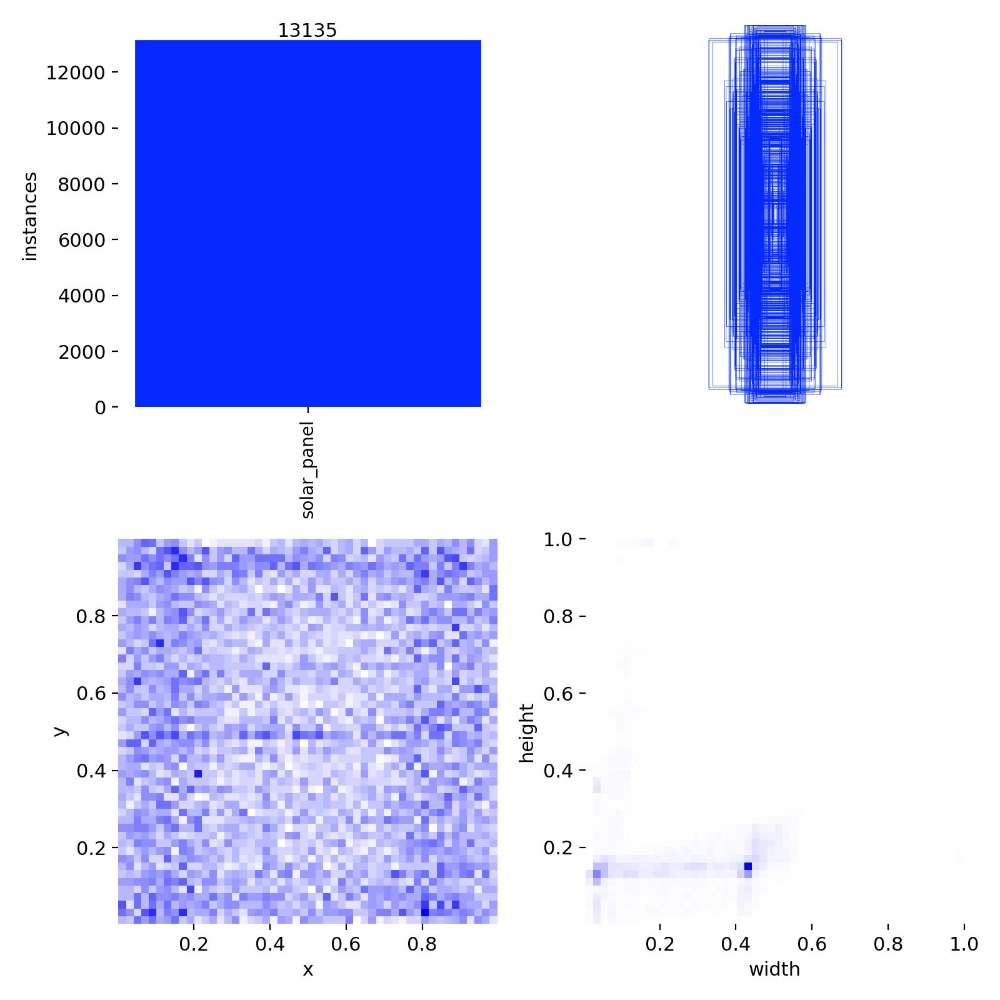

In [9]:
RESULTS_CSV = RUN_DIR / "results.csv"
RESULTS_PLOT = RUN_DIR / "labels.jpg"
BEST_MODEL = RUN_DIR / "weights" / "best.pt"
LAST_MODEL = RUN_DIR / "weights" / "last.pt"

print("Run directory:", RUN_DIR)
print("Best model:", BEST_MODEL)
print("Last model:", LAST_MODEL)


print("\nTraining curves:")
display(Image(filename=str(RESULTS_PLOT)))

Step 9.2 — Precision / Recall

In [10]:
results_df = pd.read_csv(RESULTS_CSV)

print("Epochs recorded:", len(results_df))

precision_col = "metrics/precision(M)"
recall_col = "metrics/recall(M)"

print("\nFinal Epoch:")
print("Mask Precision:", results_df[precision_col].iloc[-1])
print("Mask Recall:", results_df[recall_col].iloc[-1])

Epochs recorded: 13

Final Epoch:
Mask Precision: 0.9451
Mask Recall: 0.9472


Step 9.3 — Mask mAP50 / mAP50-95

In [11]:
map50_col = "metrics/mAP50(M)"
map5095_col = "metrics/mAP50-95(M)"

print("Final Epoch:")
print("Mask mAP50:", results_df[map50_col].iloc[-1])
print("Mask mAP50-95:", results_df[map5095_col].iloc[-1])

# Best epoch based on Mask mAP50-95
best_idx = results_df[map5095_col].idxmax()
best_row = results_df.loc[best_idx]

print("\nBest Epoch:")
print("Epoch:", int(best_row["epoch"]) + 1)
print("Mask Precision:", best_row[precision_col])
print("Mask Recall:", best_row[recall_col])
print("Mask mAP50:", best_row[map50_col])
print("Mask mAP50-95:", best_row[map5095_col])

Final Epoch:
Mask mAP50: 0.9441
Mask mAP50-95: 0.86707

Best Epoch:
Epoch: 14
Mask Precision: 0.9451
Mask Recall: 0.9472
Mask mAP50: 0.9441
Mask mAP50-95: 0.86707


# Model Evaluation

In [12]:
from IPython.display import Image, display
from ultralytics import YOLO

Loaded: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/best.pt
Training curves:


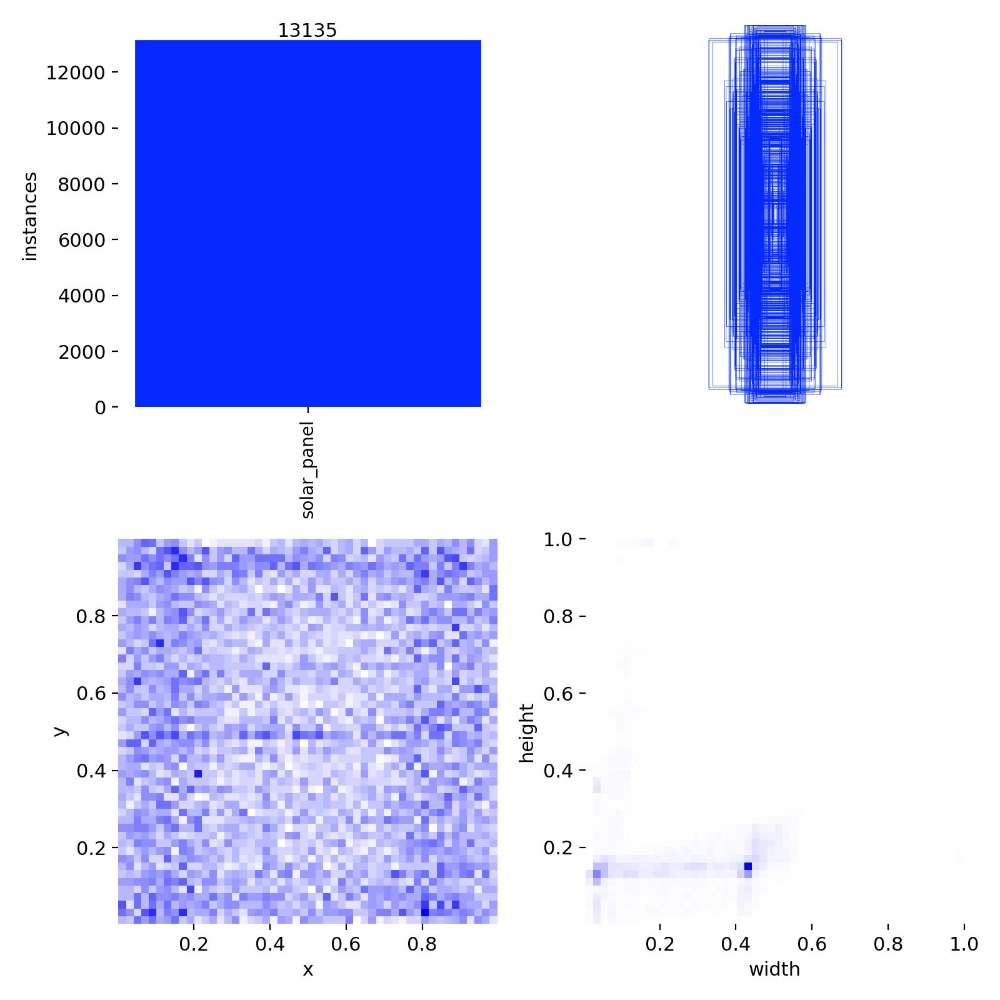

In [13]:
best_model = YOLO(str(BEST_MODEL))

print("Loaded:", BEST_MODEL)

print("Training curves:")
display(Image(filename=str(RESULTS_PLOT)))

In [14]:
YOLO_ROOT = DATASET_DIR / "yolo_dataset"
DATA_YAML = YOLO_ROOT / "data.yaml"

IMG_SIZE = 640
BATCH_SIZE = 4
EPOCHS = 50
WORKERS = 2



In [15]:
evaluation = best_model.val(
    data= str(DATA_YAML),
    split="val",
    imgsz= IMG_SIZE,
    batch=BATCH_SIZE,
    device="cpu"
)  

Ultralytics 8.4.152 🚀 Python-3.10.12 torch-2.14.0+cu130 CPU (13th Gen Intel Core i5-13420H)
YOLO26m-seg summary (fused): 146 layers, 23,508,239 parameters, 0 gradients, 121.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1525.9±338.1 MB/s, size: 80.5 KB)
val: Scanning /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/valid/labels.cache... 94 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 94/94 10.4Mit/s 0.0s
val: /home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/yolo_dataset/valid/images/DJI_20250307170026_0096_V_map-plan-67cb5da628c05b5c6a98c98b-wp-6_JPG.rf.592c086b964d8f5ba71a3fe59d72bfde.jpg: 2 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 3.7s/it 1:293.7sss
                   all         94       1036      0.943      0.945      0.936      0.815      0.945      0.947      0.944      0.867
Speed: 

In [16]:
print("Box mAP50:", evaluation.box.map50)
print("Box mAP50-95:", evaluation.box.map)

print("Mask mAP50:", evaluation.seg.map50)
print("Mask mAP50-95:", evaluation.seg.map)

print("Mask Precision:", evaluation.seg.p)
print("Mask Recall:", evaluation.seg.r)

Box mAP50: 0.9364740967279797
Box mAP50-95: 0.8154352309136851
Mask mAP50: 0.9440785914310819
Mask mAP50-95: 0.8667528613275103
Mask Precision: [     0.9451]
Mask Recall: [    0.94721]


In [17]:
results_df = pd.read_csv(RESULTS_CSV)

metric_columns = [
    "metrics/precision(B)",
    "metrics/recall(B)",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)",
    "metrics/precision(M)",
    "metrics/recall(M)",
    "metrics/mAP50(M)",
    "metrics/mAP50-95(M)"
]

available_metrics = [
    col for col in metric_columns
    if col in results_df.columns
]

print("Final epoch metrics:")

display(
    results_df[["epoch"] + available_metrics].tail(1)
)

Final epoch metrics:


,epoch,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),metrics/precision(M),metrics/recall(M),metrics/mAP50(M),metrics/mAP50-95(M)
12,13,0.94318,0.94527,0.93649,0.81529,0.9451,0.9472,0.9441,0.86707


Step 10.1 — Mask IoU

In [18]:
def calculate_mask_iou(gt_mask, pred_mask):

    intersection = np.logical_and(
        gt_mask,
        pred_mask
    ).sum()

    union = np.logical_or(
        gt_mask,
        pred_mask
    ).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    return intersection / union


print("Mask IoU function ready.")

Mask IoU function ready.


Step 10.2 — Validation Mask IoU

In [19]:
import cv2
import numpy as np
VAL_IMAGES = YOLO_ROOT / "valid" / "images"

In [20]:
val_results = best_model.predict(
    source=str(VAL_IMAGES),
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    device="cpu",
    conf=0.25,
    verbose=False
)

ious = []

for result in val_results:

    if result.masks is None:
        continue

    image_path = Path(result.path)

    label_path = (
        YOLO_ROOT
        / "valid"
        / "labels"
        / f"{image_path.stem}.txt"
    )

    if not label_path.exists():
        continue

    image = cv2.imread(str(image_path))

    if image is None:
        continue

    height, width = image.shape[:2]

    # Ground-truth mask
    gt_mask = np.zeros(
        (height, width),
        dtype=np.uint8
    )

    lines = label_path.read_text().splitlines()

    for line in lines:

        values = line.split()

        if len(values) < 7:
            continue

        points = np.array(
            values[1:],
            dtype=np.float32
        ).reshape(-1, 2)

        points[:, 0] *= width
        points[:, 1] *= height

        points = points.astype(np.int32)

        cv2.fillPoly(
            gt_mask,
            [points],
            1
        )

    # Predicted mask
    pred_mask = np.zeros(
        (height, width),
        dtype=np.uint8
    )

    for mask in result.masks.data:

        mask_np = mask.cpu().numpy()

        mask_np = cv2.resize(
            mask_np,
            (width, height),
            interpolation=cv2.INTER_NEAREST
        )

        pred_mask[mask_np > 0.5] = 1

    iou = calculate_mask_iou(
        gt_mask,
        pred_mask
    )

    ious.append(iou)

In [21]:
print("Images evaluated:", len(ious))

if ious:
    print("Mean Mask IoU:", round(float(np.mean(ious)), 4))
    print("Minimum Mask IoU:", round(float(np.min(ious)), 4))
    print("Maximum Mask IoU:", round(float(np.max(ious)), 4))

Images evaluated: 93
Mean Mask IoU: 0.952
Minimum Mask IoU: 0.7924
Maximum Mask IoU: 0.9807


# Prediction Visualization

In [22]:
TEST_IMAGES = YOLO_ROOT / "test" / "images"

test_results = best_model.predict(
    source=str(TEST_IMAGES),
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    device="cpu",
    conf=0.25,
    verbose=False
)

print("Test images evaluated:", len(test_results))

Test images evaluated: 64


Display Test Predictions

In [23]:
import matplotlib.pyplot as plt

In [25]:
def draw_ground_truth(image_path, label_path):

    image = cv2.imread(str(image_path))

    if image is None:
        return None

    height, width = image.shape[:2]

    lines = label_path.read_text().splitlines()

    for line in lines:

        values = line.split()

        if len(values) < 7:
            continue

        points = np.array(
            values[1:],
            dtype=np.float32
        ).reshape(-1, 2)

        points[:, 0] *= width
        points[:, 1] *= height

        points = points.astype(np.int32)

        cv2.polylines(
            image,
            [points],
            isClosed=True,
            color=(0, 255, 0),
            thickness=2
        )

    return cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

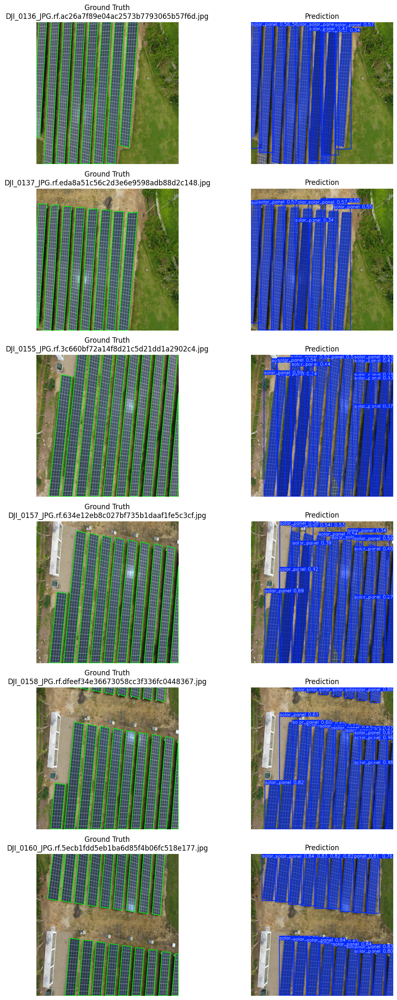

In [26]:
num_images = min(6, len(test_results))

fig, axes = plt.subplots(
    num_images,
    2,
    figsize=(12, 4 * num_images)
)

if num_images == 1:
    axes = np.expand_dims(axes, axis=0)

for i in range(num_images):

    result = test_results[i]

    image_path = Path(result.path)

    label_path = (
        YOLO_ROOT
        / "test"
        / "labels"
        / f"{image_path.stem}.txt"
    )

    # Ground truth
    if label_path.exists():

        gt_image = draw_ground_truth(
            image_path,
            label_path
        )

    else:

        image = cv2.imread(str(image_path))
        gt_image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

    # Prediction
    pred_image = result.plot()

    pred_image = cv2.cvtColor(
        pred_image,
        cv2.COLOR_BGR2RGB
    )

    axes[i, 0].imshow(gt_image)
    axes[i, 0].set_title(
        f"Ground Truth\n{image_path.name}"
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(pred_image)
    axes[i, 1].set_title(
        "Prediction"
    )
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

# Model Testing

In [27]:
difficult_results = test_results[:6]

print("Difficult-case images selected:", len(difficult_results))

Difficult-case images selected: 6


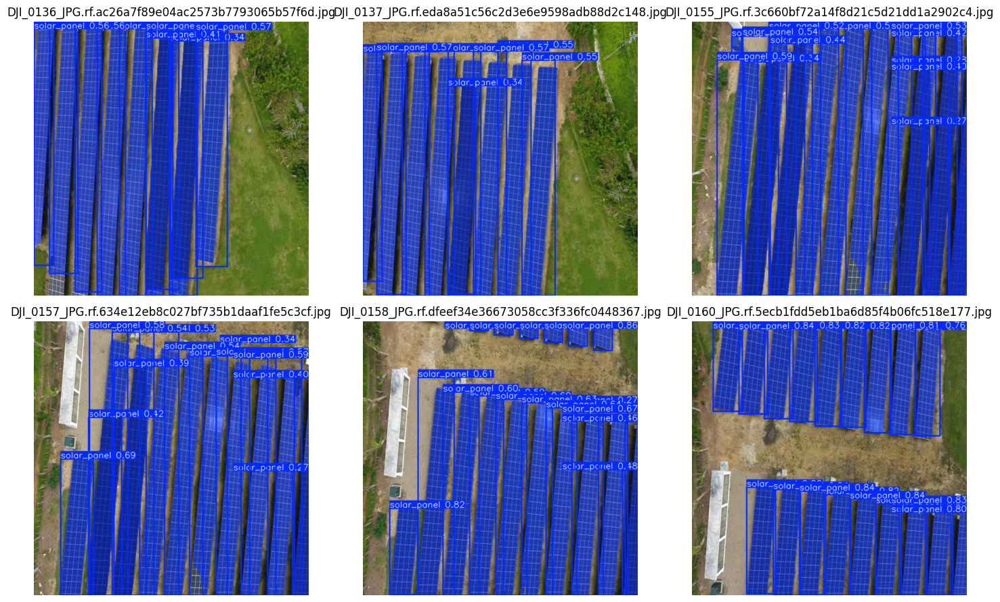

In [28]:
num_images = len(difficult_results)

fig, axes = plt.subplots(
    2,
    3,
    figsize=(15, 9)
)

axes = axes.flatten()

for i, result in enumerate(difficult_results):

    plotted = result.plot()

    plotted = cv2.cvtColor(
        plotted,
        cv2.COLOR_BGR2RGB
    )

    axes[i].imshow(plotted)
    axes[i].set_title(
        Path(result.path).name
    )
    axes[i].axis("off")

for i in range(num_images, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Model Deployment

In [29]:
FINAL_MODEL = BEST_MODEL

print("Final model:")
print(FINAL_MODEL)

print("\nModel exists:", FINAL_MODEL.exists())

Final model:
/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/best.pt

Model exists: True


In [30]:
print("Final Segmentation Metrics")
print("---------------------------")

print("Mask Precision :", evaluation.seg.p)
print("Mask Recall    :", evaluation.seg.r)
print("Mask mAP50     :", evaluation.seg.map50)
print("Mask mAP50-95  :", evaluation.seg.map)

if ious:
    print("Mean Mask IoU  :", np.mean(ious))

Final Segmentation Metrics
---------------------------
Mask Precision : [     0.9451]
Mask Recall    : [    0.94721]
Mask mAP50     : 0.9440785914310819
Mask mAP50-95  : 0.8667528613275103
Mean Mask IoU  : 0.9519772878411935


In [31]:
import time

test_image_paths = list(TEST_IMAGES.glob("*"))

if test_image_paths:

    sample_image = str(test_image_paths[0])

    # Warm-up
    best_model.predict(
        source=sample_image,
        imgsz=IMG_SIZE,
        device="cpu",
        conf=0.25,
        verbose=False
    )

    start_time = time.perf_counter()

    best_model.predict(
        source=sample_image,
        imgsz=IMG_SIZE,
        device="cpu",
        conf=0.25,
        verbose=False
    )

    end_time = time.perf_counter()

    inference_time = end_time - start_time

    print("Inference time:", round(inference_time, 4), "seconds/image")
    print("Inference speed:", round(inference_time * 1000, 2), "ms/image")

Inference time: 0.9905 seconds/image
Inference speed: 990.47 ms/image


In [32]:
print("FINAL MODEL SUMMARY")
print("===================")

print("Model:", FINAL_MODEL.name)

print("\nSegmentation Performance:")
print("Mask Precision :", round(float(evaluation.seg.p), 4))
print("Mask Recall    :", round(float(evaluation.seg.r), 4))
print("Mask mAP50     :", round(float(evaluation.seg.map50), 4))
print("Mask mAP50-95  :", round(float(evaluation.seg.map), 4))

if ious:
    print("Mean Mask IoU  :", round(float(np.mean(ious)), 4))

if test_image_paths:
    print("\nInference:")
    print("Time/image     :", round(float(inference_time), 4), "seconds")
    print("Speed          :", round(float(inference_time * 1000), 2), "ms/image")

FINAL MODEL SUMMARY
Model: best.pt

Segmentation Performance:
Mask Precision : 0.9451
Mask Recall    : 0.9472
Mask mAP50     : 0.9441
Mask mAP50-95  : 0.8668
Mean Mask IoU  : 0.952

Inference:
Time/image     : 0.9905 seconds
Speed          : 990.47 ms/image


/tmp/ipykernel_38906/3886572248.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Mask Precision :", round(float(evaluation.seg.p), 4))
/tmp/ipykernel_38906/3886572248.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Mask Recall    :", round(float(evaluation.seg.r), 4))


Export Model to ONNX

In [33]:
onnx_path = best_model.export(
    format="onnx",
    imgsz=IMG_SIZE,
    device="cpu"
)

print("ONNX export completed.")
print("ONNX model:", onnx_path)

Ultralytics 8.4.152 🚀 Python-3.10.12 torch-2.14.0+cu130 CPU (13th Gen Intel Core i5-13420H)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino
YOLO26m-seg summary (fused): 146 layers, 23,508,239 parameters, 0 gradients, 121.4 GFLOPs

PyTorch: starting from '/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (206.7 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 KB 16.

In [34]:
ONNX_MODEL = Path(onnx_path)

print("ONNX model:")
print(ONNX_MODEL)

print("Exists:", ONNX_MODEL.exists())

if ONNX_MODEL.exists():
    print(
        "Size:",
        round(ONNX_MODEL.stat().st_size / (1024 * 1024), 2),
        "MB"
    )

ONNX model:
/home/hraj/Workspace/Solor_defect_DB/solar-panel-segmentation/runs/solar_panel_seg_baseline_v2/weights/best.onnx
Exists: True
Size: 89.99 MB
